# Prototyping Settings for Simplistic DESC SRD Y1

For reference, the DESC SRD can be found [here](https://arxiv.org/pdf/1809.01669.pdf). Appendix D2 specifies some of the analysis choices for the Y1 data. 

In particular:
- neff for lensing sources: 10 gal/arcmin^2
- sigma_e: 0.26 per component
- lmax: 3000


In this notebook, we will try to find simulation settings that can get us close to these specifications, and use a kappa TNG map as a reference point.

## Defining FlowPM simulation

In [1]:
%pylab inline 
import pickle
import tensorflow_addons as tfa
import tensorflow as tf
import flowpm
from flowpm.tfpower import linear_matter_power
import DifferentiableHOS as DHOS
from itertools import cycle

Populating the interactive namespace from numpy and matplotlib


In [2]:
from nbodykit.cosmology import Cosmology
from nbodykit.cosmology.power.halofit import HalofitPower
from astropy.cosmology import Planck15
import astropy.units as u
from flowpm import tfpm
from flowpm.utils import cic_paint, compensate_cic
from flowpm.tfpower import linear_matter_power
from functools import partial

In [3]:
# Loads PGD parameters
with open('/global/u1/d/dlan/DifferentiableHOS/notebooks/results_fit_PGD_205_128.pkl', "rb") as f:
    pgd_data = pickle.load(f)
    pgdparams = pgd_data['params']

In [4]:
# Below are a few parameters
n_lens = 11       # Number of lensplanes in the lightcone
box_size = 205.   # Transverse comoving size of the simulation volume
nc = 128          # Number of transverse voxels in the simulation volume
field_size = 5    # Size of the lensing field in degrees
field_npix = 1024 # Number of pixels in the lensing field
batch_size = 1    # Number of simulations to run in parallel
z_source = np.array([1.]) # We'll be using a single redshift for now

In [5]:
# Instantiates a cosmology with desired parameters
cosmology = flowpm.cosmology.Planck15()
# Schedule the center of the lensplanes we want for ray tracing
r = tf.linspace(0., box_size*n_lens, n_lens+1)
r_center = 0.5*(r[1:] + r[:-1])
# Retrieve the scale factor corresponding to these distances
a = flowpm.tfbackground.a_of_chi(cosmology, r)
a_center =flowpm.tfbackground.a_of_chi(cosmology, r_center)
# We run 4 steps from initial scale factor to start of raytracing
init_stages = tf.linspace(0.1, a[-1], 4)
# Then one step per lens plane
stages = tf.concat([init_stages, a_center.numpy()[::-1]], axis=0)

In [6]:
#Create some initial conditions
initial_conditions = flowpm.linear_field([nc, nc, nc],
                                         [box_size, box_size, box_size], 
                                         lambda k: tf.cast(linear_matter_power(cosmology, k), tf.complex64),         
                                         batch_size=batch_size)
initial_state = flowpm.lpt_init(cosmology, initial_conditions, 0.1)

In [7]:
nbdykit_cosmo = Cosmology.from_astropy(Planck15.clone(m_nu=0 * u.eV))
nbdykit_cosmo = nbdykit_cosmo.match(sigma8=cosmology.sigma8.numpy())

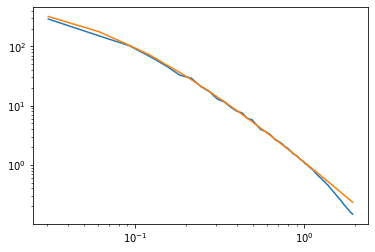

In [8]:
field = cic_paint(tf.zeros_like(initial_conditions), initial_state[0])
field = compensate_cic(field)

k, pk = flowpm.power_spectrum(
  field,
  boxsize=np.array([box_size] * 3),
  kmin=np.pi / box_size,
  dk=2 * np.pi / box_size)

target_pk = HalofitPower(nbdykit_cosmo, 1. / 0.1 - 1.)(k)

loglog(k,pk[0])
loglog(k, target_pk)

In [9]:
# Run the Nbody

states = flowpm.nbody(cosmology, 
                      initial_state, 
                      stages,
                      [nc, nc, nc],
                      return_intermediate_states=True) 



In [10]:
# Run the Nbody
states_pgd = flowpm.nbody(cosmology, 
                      initial_state, 
                      stages,
                      [nc, nc, nc],
                      return_intermediate_states=True,
                      pgdparams=pgdparams) 

Here I apply a Gaussian smoothing of 100kpc on the lensplanes, which is about 1.024 pixels at 2048 pix/205Mpc

In [11]:
import tensorflow_probability as tfp
tfd = tfp.distributions

In [12]:
def make_power_map(power_spectrum, size, kps=None):
  #Ok we need to make a map of the power spectrum in Fourier space
  k1 = np.fft.fftfreq(size)

  k2 = np.fft.fftfreq(size)
 
  kcoords = np.meshgrid(k1,k2)
 
  # Now we can compute the k vector
  k = np.sqrt(kcoords[0]**2 + kcoords[1]**2)
 
  if kps is None:
    kps = np.linspace(0,0.5,len(power_spectrum))
  # And we can interpolate the PS at these positions
 
  ps_map = np.interp(k.flatten(), kps, power_spectrum).reshape([size,size])
 
  ps_map = tf.cast(ps_map,dtype=tf.float32)
  return ps_map

In [13]:
from scipy.stats import norm
def fourier_smoothing(kappa, sigma,resolution):
  im = tf.signal.fft2d(tf.cast(kappa, tf.complex64))
  kps = np.linspace(0,0.5,resolution)
  filter=norm(0, 1./(2.*np.pi*sigma)).pdf(kps)
  m = make_power_map(filter, resolution, kps=kps)
  m /= m[0,0]
  im = tf.cast(tf.reshape(m, [1, resolution, resolution]), tf.complex64) * im
  return tf.cast( tf.signal.ifft2d(im), tf.float32)

In [14]:
%%time
# Extract the lensplanes
lensplanes = []
for i in range(len(a_center)):
    plane = flowpm.raytracing.density_plane(states[::-1][i][1],
                                            [nc, nc, nc],
                                            nc//2,
                                            width=nc,
                                            plane_resolution=2048)
    plane = tf.expand_dims(plane, axis=-1)
    plane =fourier_smoothing(plane[...,0], sigma=1.024,resolution=2048)
    lensplanes.append((r_center[i], states[::-1][i][0], plane))

CPU times: user 47.8 s, sys: 24.7 s, total: 1min 12s
Wall time: 34.3 s


In [15]:
%%time
# Extract the lensplanes, but with PGD
lensplanes_pgd = []

for i in range(len(a_center)):
    plane = flowpm.raytracing.density_plane(states_pgd[::-1][i][1],
                                            [nc, nc, nc],
                                            nc//2,
                                            width=nc,
                                            plane_resolution=2048)
    plane = tf.expand_dims(plane, axis=-1)
    plane = fourier_smoothing(plane[...,0], sigma=1.024,resolution=2048)
    lensplanes_pgd.append((r_center[i], states_pgd[::-1][i][0], plane))

CPU times: user 48.1 s, sys: 26.2 s, total: 1min 14s
Wall time: 34.9 s


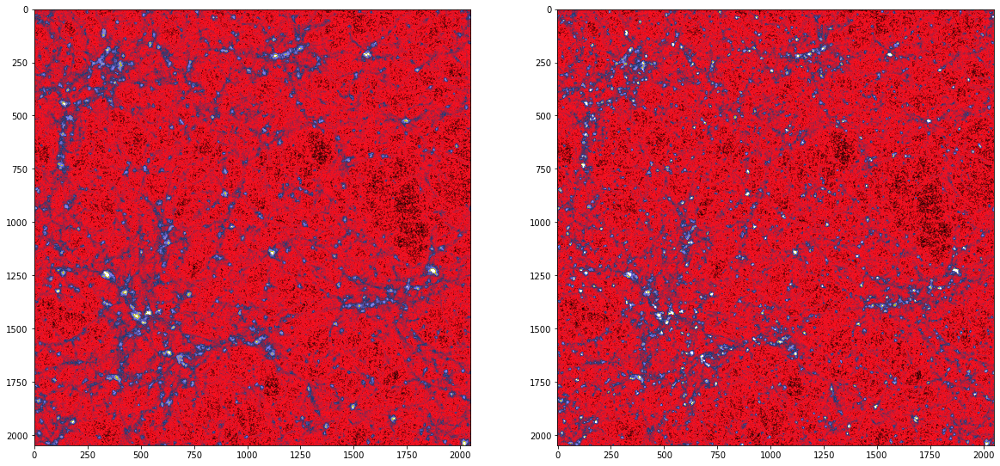

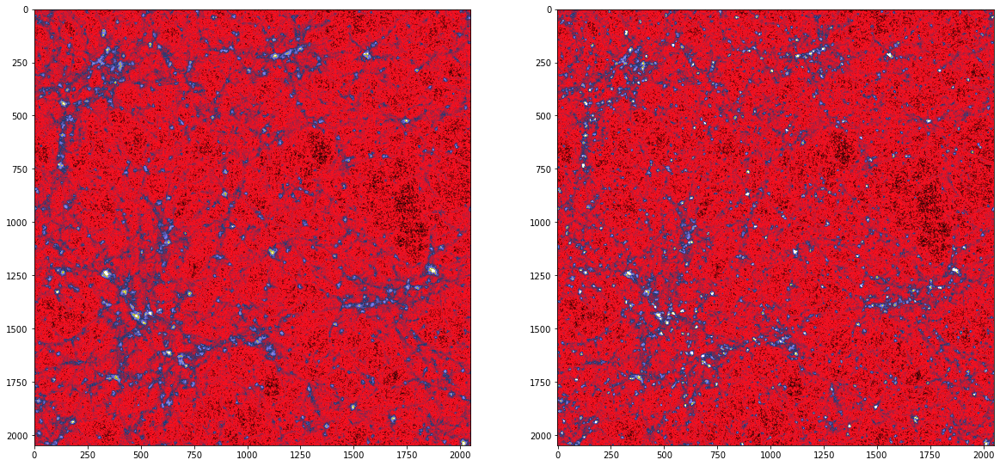

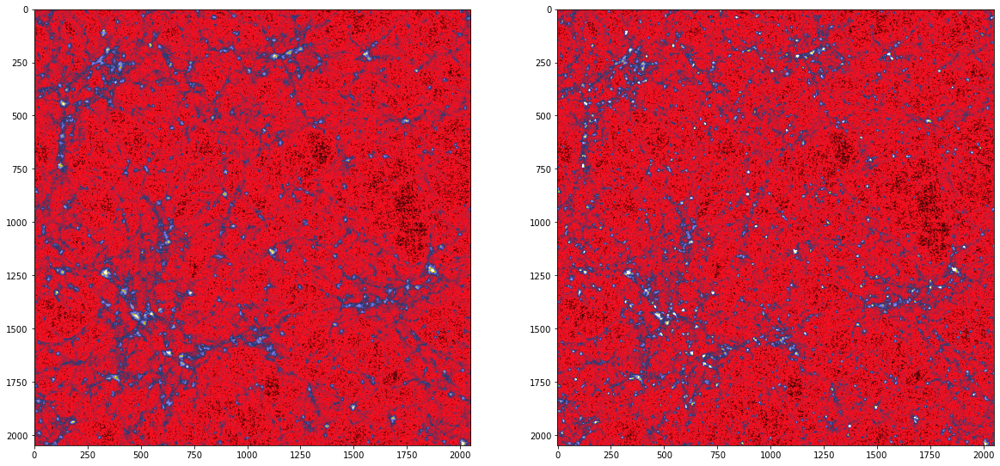

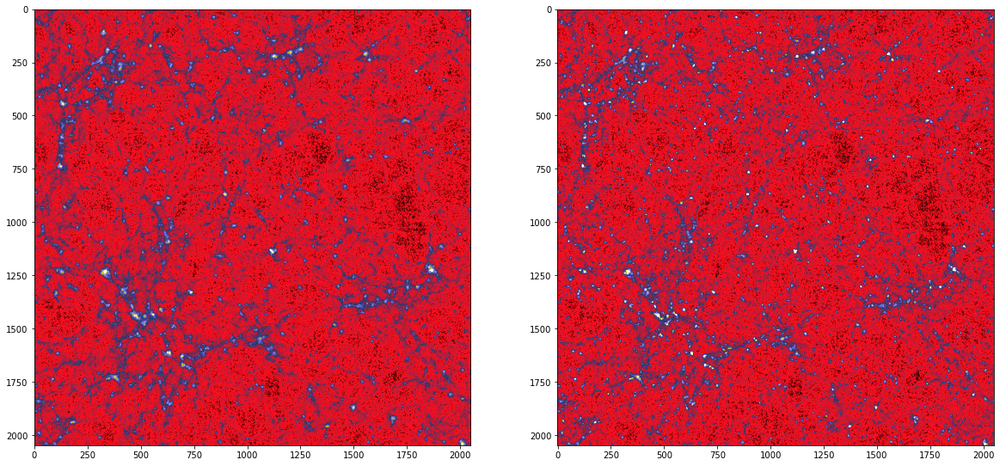

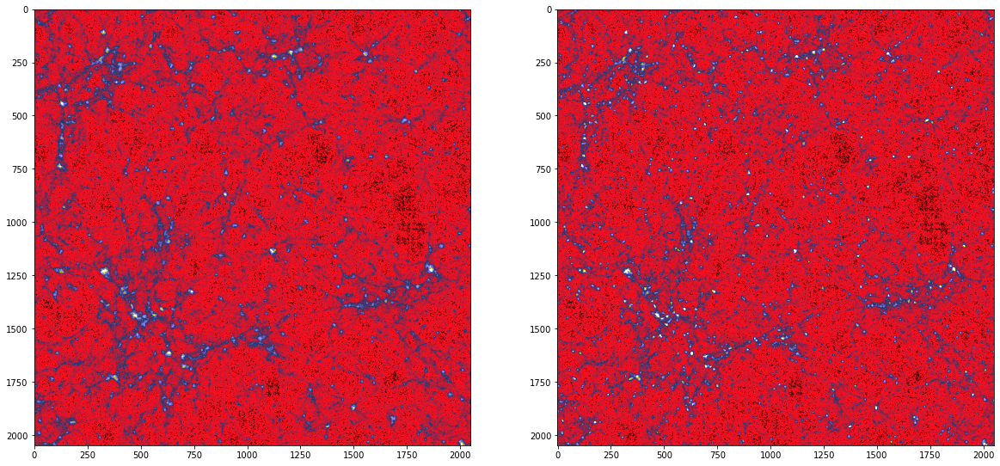

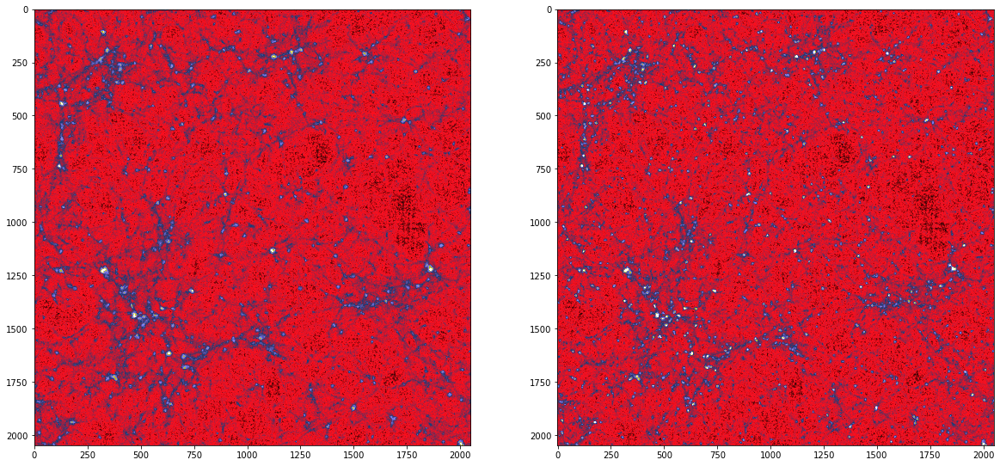

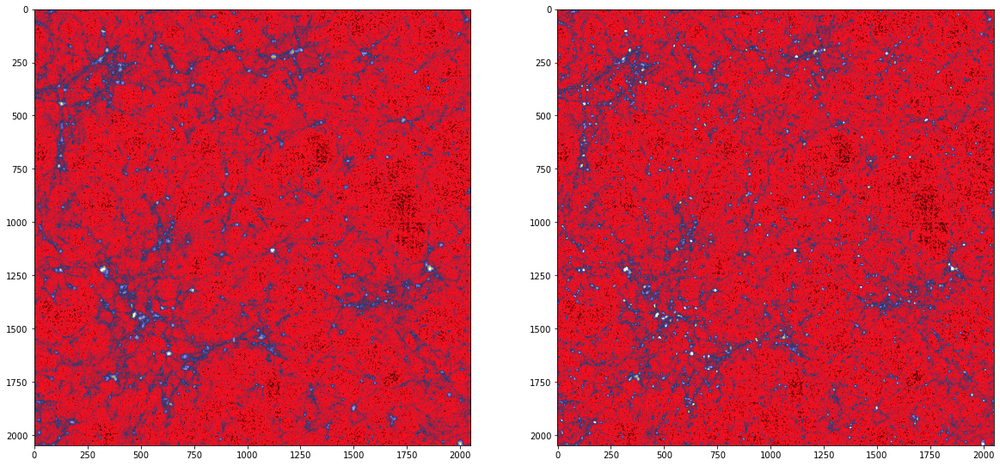

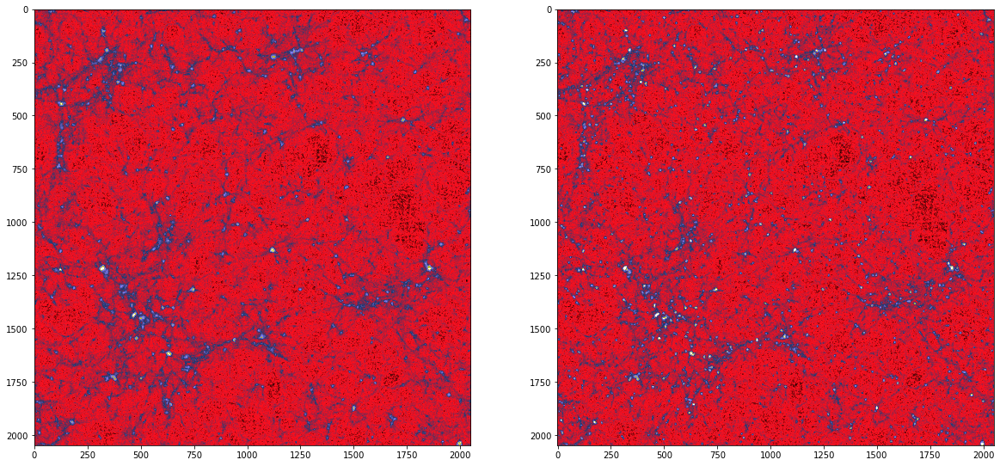

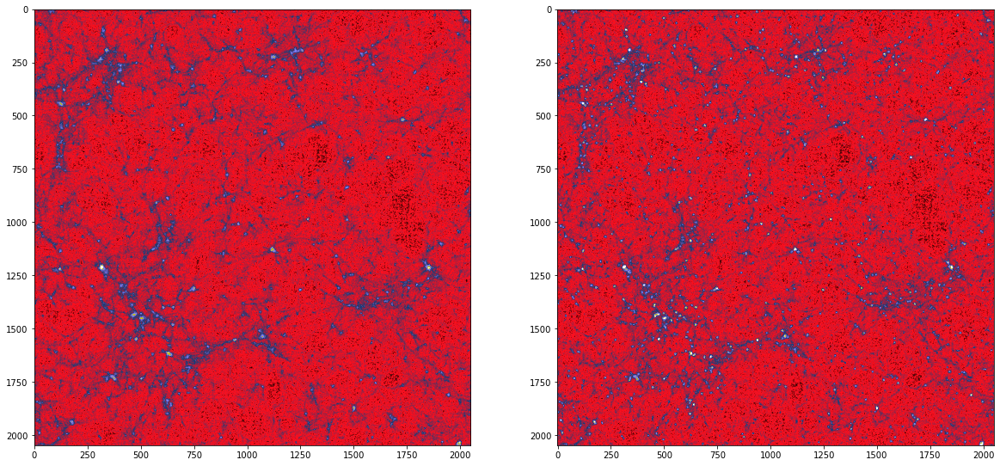

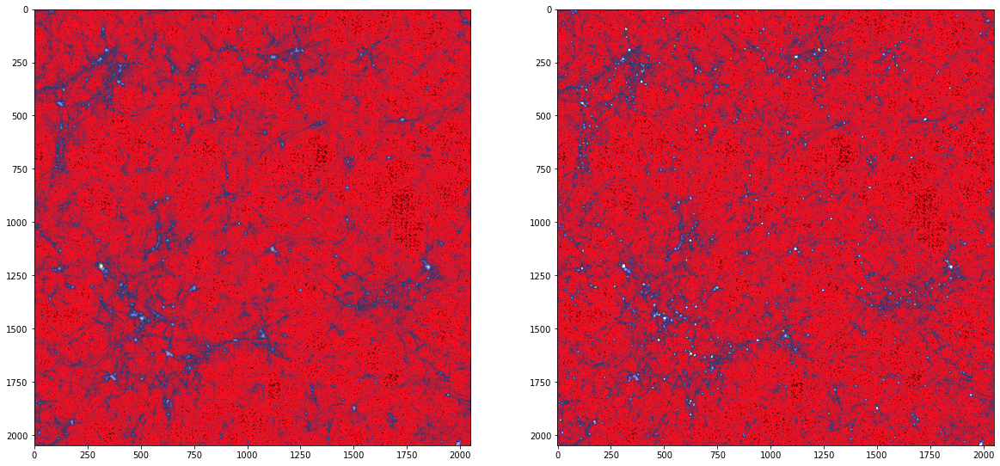

In [16]:
for i in range(10):
    figure(figsize=[20,10])
    subplot(121)
    imshow(lensplanes[i][-1][0],cmap='gist_stern',vmin=0,vmax=10)
    subplot(122)
    imshow(lensplanes_pgd[i][-1][0],cmap='gist_stern',vmin=0,vmax=10)

In [17]:
%%time

# Extract the lensplanes
lensplanes = []
matrix = flowpm.raytracing.rotation_matrices()
for i, j in zip(range(len(a_center)), cycle(range(6))):
    plane = flowpm.raytracing.density_plane(states[::-1][i][1],
                                            [nc, nc, nc],
                                            nc//2,
                                            width=nc,
                                            plane_resolution=2048,
                                            rotation=matrix[j],
                                            shift=flowpm.raytracing.random_2d_shift())
    plane = fourier_smoothing(plane,sigma=1.024,resolution=2048)
    lensplanes.append((r_center[i], states[::-1][i][0], plane))

CPU times: user 49.5 s, sys: 28.6 s, total: 1min 18s
Wall time: 35.3 s


In [18]:
%%time
# Extract the lensplanes
lensplanes_pgd = []
matrix = flowpm.raytracing.rotation_matrices()
for i, j in zip(range(len(a_center)), cycle(range(6))):
    plane = flowpm.raytracing.density_plane(states_pgd[::-1][i][1],
                                            [nc, nc, nc],
                                            nc//2,
                                            width=nc,
                                            plane_resolution=2048,
                                            rotation=matrix[j],
                                            shift=flowpm.raytracing.random_2d_shift())
    plane = fourier_smoothing(plane,sigma=1.024,resolution=2048)
    lensplanes_pgd.append((r_center[i], states_pgd[::-1][i][0], plane))

CPU times: user 50.9 s, sys: 20.4 s, total: 1min 11s
Wall time: 33.6 s


In [19]:
%%time
# Get convergence map
import astropy.units as u
xgrid, ygrid = np.meshgrid(np.linspace(0, field_size, field_npix, endpoint=False), # range of X coordinates
                           np.linspace(0, field_size, field_npix, endpoint=False)) # range of Y coordinates

coords = np.stack([xgrid, ygrid], axis=0)*u.deg
c = coords.reshape([2, -1]).T.to(u.rad)

m = flowpm.raytracing.convergenceBorn(cosmology, 
                    lensplanes, 
                    dx=box_size/2048, 
                    dz=box_size,
                    coords=c,
                    z_source=z_source)

m= tf.reshape(m, [batch_size, field_npix,field_npix])
m_pgd = flowpm.raytracing.convergenceBorn(cosmology, 
                    lensplanes_pgd, 
                    dx=box_size/2048, 
                    dz=box_size,
                    coords=c,
                    z_source=z_source)

m_pgd = tf.reshape(m_pgd, [batch_size, field_npix,field_npix])


CPU times: user 11.8 s, sys: 2.58 s, total: 14.4 s
Wall time: 3.67 s


## Comparison to Analytical $halofit$ predictions


In [20]:
l, ps_pgd= DHOS.statistics.power_spectrum(m_pgd[0],field_size,field_npix)
l, ps= DHOS.statistics.power_spectrum(m[0],field_size,field_npix)

In [21]:

import jax_cosmo as jc
cosmo=jc.Planck15()
nz =jc.redshift.delta_nz(z_source)
probes = [jc.probes.WeakLensing([nz])] 
cls = jc.angular_cl.angular_cl(cosmo, l.numpy(), probes)


/global/homes/d/dlan/.local/cori/3.8-anaconda-2020.11/lib/python3.8/site-packages/jax/_src/numpy/lax_numpy.py:5293: UserWarning: Explicitly requested dtype <class 'jax._src.numpy.lax_numpy.int64'> requested in astype is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  lax._check_user_dtype_supported(dtype, "astype")


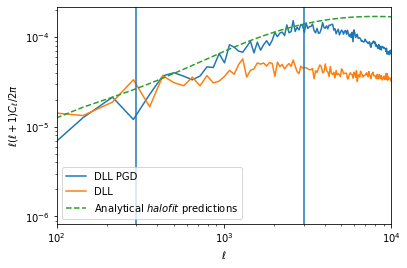

In [22]:
loglog(l, l*(l+1)*ps_pgd/(2*np.pi),label='DLL PGD ')
loglog(l, l*(l+1)*ps/(2*np.pi),label='DLL')
loglog(l, l*(l+1)*cls[0]/(2*np.pi),'--',label='Analytical $halofit$ predictions')
xlim(1e2,1e4)
#ylim(4e-9,4e-2)
axvline(300)
axvline(3000)
ylabel('$\ell(\ell+1)C_\ell /2\pi$')
xlabel('$\ell$')
legend()
#savefig('cl_comp1_64.png',dpi=250)

## Comparison to kappa TNG

For comparison, we are using this map at redshift 1 from the kappa TNG simulations.

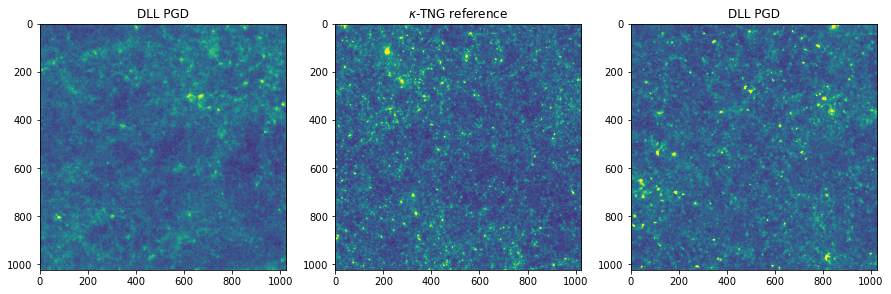

In [23]:
# 2048
figure(figsize=[15,5])
subplot(131)
imshow(m[0],vmax=0.1, vmin=-0.05)
title('DLL PGD')
subplot(132)
imshow(np.load('kappa_tng.npy'), vmax=0.1, vmin=-0.05)
title('$\kappa$-TNG reference')
subplot(133)
imshow(m_pgd[0],vmax=0.1, vmin=-0.05)
title('DLL PGD');


In [24]:
kTNG = np.load('kappa_tng.npy')

In [25]:
l, ps_TNG=DHOS.statistics.power_spectrum(kTNG,field_size,field_npix)

Text(0.5, 1.0, 'Comparison to $\\kappa$-TNG')

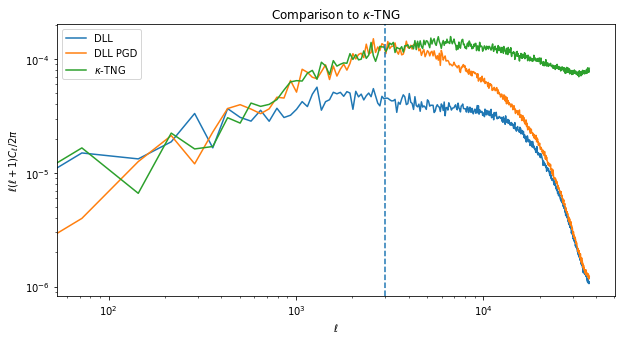

In [26]:
figure(figsize=[10,5])
loglog(l, l*(l+1)*ps/(2*pi), label='DLL')
loglog(l, l*(l+1)*ps_pgd/(2*pi), label='DLL PGD')
loglog(l, l*(l+1)*ps_TNG/(2*pi), label='$\kappa$-TNG')
#loglog(l, l*(l+1)*cls[0]/(2*np.pi),'--',label='Analytical $halofit$ predictions')
legend()
axvline(3000, ls='--')
ylabel('$\ell(\ell+1)C_\ell /2\pi$')
xlabel('$\ell$')
title('Comparison to $\kappa$-TNG')

In [27]:
counts_FLP_PGD,bins_=DHOS.statistics.peaks_histogram_tf(m_pgd[0],tf.linspace(-0.035,0.2,16))
counts_TNG, bins_TNG=DHOS.statistics.peaks_histogram_tf(np.float32(kTNG),tf.linspace(-0.035,0.2,16))
counts_FLP,bins_=DHOS.statistics.peaks_histogram_tf(m[0],tf.linspace(-0.035,0.2,16))

In [28]:
center_ = (bins_[:-1] + bins_[1:]) / 2

Text(0.5, 0, '$\\kappa$')

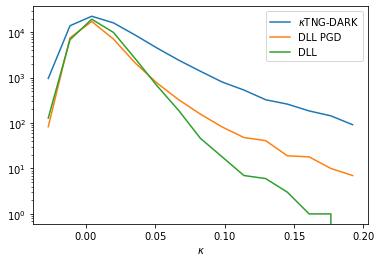

In [29]:
semilogy(center_, counts_TNG, label='$\kappa$TNG-DARK ')
semilogy(center_, counts_FLP_PGD, label='DLL PGD')
semilogy(center_, counts_FLP, label='DLL ')
legend()
xlabel('$\kappa$')

So, obvioulsy our 128^3 simulation is not as precise as kappa TNG, but we won't be working at the native 0.3 arcmin resolution anyway, in practice we'll have noise and smoothing.

So let's see how much smoothing gets us in the right ball park.

In [30]:
pix_scale = 5/1024*60              # arcmin
sigma_pix=1/pix_scale

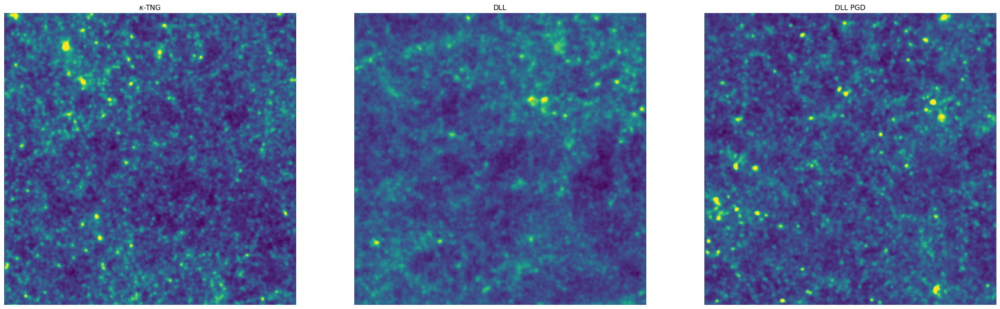

In [31]:

figure(figsize=[30,10])
subplot(131)
title('$\kappa$-TNG')
imshow(fourier_smoothing(kTNG,sigma=sigma_pix,resolution=field_npix)[0], vmax=0.075)
axis('off')
subplot(132)
title('DLL')
imshow(fourier_smoothing(m,sigma=sigma_pix,resolution=field_npix)[0], vmax=0.075)
axis('off')
subplot(133)
title('DLL PGD')
imshow(fourier_smoothing(m_pgd,sigma=sigma_pix,resolution=field_npix)[0], vmax=0.075)
axis('off')
savefig('map_comp.png',dpi=250)

In [32]:
# Let's check power spectra
l, ps_DLL_pgd= DHOS.statistics.power_spectrum(fourier_smoothing(m_pgd,sigma=sigma_pix,resolution=field_npix)[0],field_size,field_npix)
l, ps_TNG=DHOS.statistics.power_spectrum(fourier_smoothing(kTNG,sigma=sigma_pix,resolution=field_npix)[0],field_size,field_npix)
l, ps_DLL= DHOS.statistics.power_spectrum(fourier_smoothing(m,sigma=sigma_pix,resolution=field_npix)[0],field_size,field_npix)

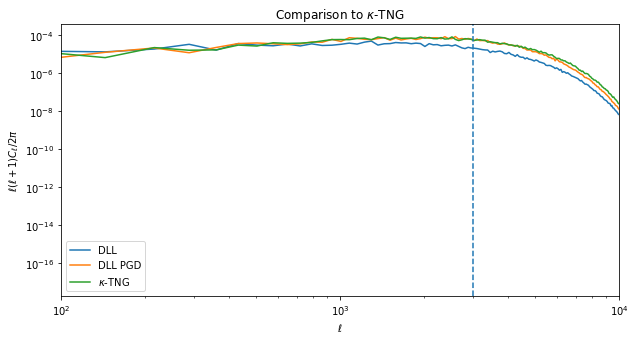

In [33]:
figure(figsize=[10,5])
loglog(l, l*(l+1)*ps_DLL/(2*pi), label='DLL')
loglog(l, l*(l+1)*ps_DLL_pgd/(2*pi), label='DLL PGD')
loglog(l, l*(l+1)*ps_TNG/(2*pi), label='$\kappa$-TNG')
legend()
axvline(3000, ls='--')
# ylim(10e-9,10e-3)
xlim(1e2,1e4)
ylabel('$\ell(\ell+1)C_\ell /2\pi$')
xlabel('$\ell$')
title('Comparison to $\kappa$-TNG')
savefig('ps_comp.png',dpi=250)

In [34]:
# Let's also compare native peak counts
re,rh = DHOS.statistics.peaks_histogram_tf(np.float32(fourier_smoothing(kTNG,sigma=sigma_pix,resolution=field_npix)[0]),tf.linspace(-0.025,0.1,16))
te,th = DHOS.statistics.peaks_histogram_tf(np.float32(fourier_smoothing(m,sigma=sigma_pix,resolution=field_npix)[0]),tf.linspace(-0.025,0.1,16))
tepgd,thpgd = DHOS.statistics.peaks_histogram_tf(np.float32(fourier_smoothing(m_pgd,sigma=sigma_pix,resolution=field_npix)[0]),tf.linspace(-0.025,0.1,16))


In [35]:
center_ = (rh[:-1] + rh[1:]) / 2

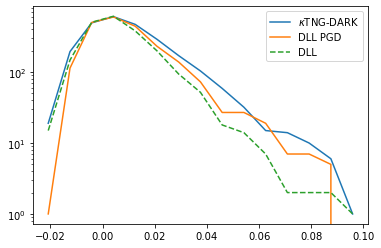

In [36]:
semilogy(center_, re, label='$\kappa$TNG-DARK ')
semilogy(center_, tepgd, label='DLL PGD')
semilogy(center_, te, '--', label='DLL')
legend()
savefig('pk.png',dpi=250)

## Adding noise

We'll now try to get to a realistic setting that matches some of the SRD Y1 settings.

In [37]:
ngal = 10                          # gal/arcmin **2
ngal_per_pix = ngal * pix_scale**2 # galaxies per pixels (I think)
sigma_e = 0.26 / sqrt(2 * ngal_per_pix) # Rescaled noise sigma

In [38]:
pix_scale

0.29296875

In [39]:
knTNG= np.load('kappa_tng.npy')+ sigma_e * randn(1024,1024), 5*u.deg
knFPM = m_pgd[0]+ sigma_e * randn(1024,1024), 5*u.deg


(-0.5, 1023.5, 1023.5, -0.5)

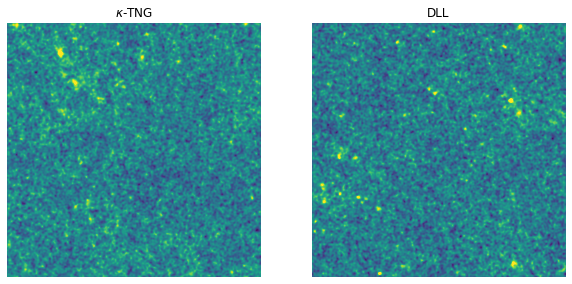

In [40]:
# Here is what it looks like with noise 
figure(figsize=[10,20])
subplot(121)
title('$\kappa$-TNG')
imshow(fourier_smoothing(knTNG[0],sigma=sigma_pix,resolution=field_npix)[0], vmax=0.1)
axis('off')
subplot(122)
title('DLL')
imshow(fourier_smoothing(knFPM[0],sigma=sigma_pix,resolution=field_npix)[0], vmax=0.1)
axis('off')

In [41]:
l, ps_FLP_n= DHOS.statistics.power_spectrum(fourier_smoothing(knTNG[0],sigma=sigma_pix,resolution=field_npix)[0],field_size,field_npix)
l, ps_TNG_n=DHOS.statistics.power_spectrum(fourier_smoothing(knFPM[0],sigma=sigma_pix,resolution=field_npix)[0],field_size,field_npix)



Text(0.5, 1.0, 'Comparison to $\\kappa$TNG 1 arcmin smoothing and noise')

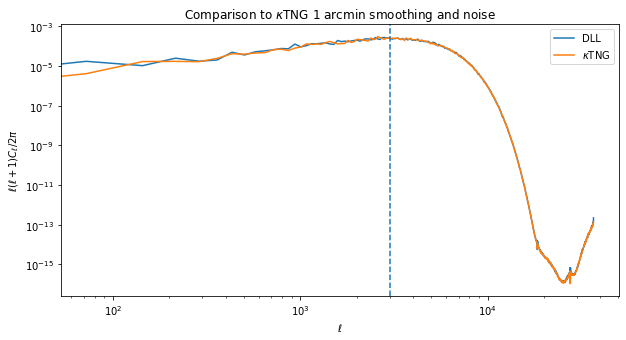

In [42]:
figure(figsize=[10,5])
loglog(l, l*(l+1)*ps_FLP_n/(2*pi), label='DLL')
loglog(l, l*(l+1)*ps_TNG_n/(2*pi),  label='$\kappa$TNG')
legend()
axvline(3000, ls='--')
ylabel('$\ell(\ell+1)C_\ell /2\pi$')
xlabel('$\ell$')
title('Comparison to $\kappa$TNG 1 arcmin smoothing and noise')

In [43]:
# Let's also compare native peak counts
tepgd,thpgd = DHOS.statistics.peaks_histogram_tf(fourier_smoothing(knFPM[0],sigma=sigma_pix,resolution=field_npix)[0],tf.linspace(-0.035,0.15,16))
te,th = DHOS.statistics.peaks_histogram_tf(fourier_smoothing(knTNG[0],sigma=sigma_pix,resolution=field_npix)[0],tf.linspace(-0.035,0.15,16))


In [44]:
center_ = (th[:-1] + th[1:]) / 2

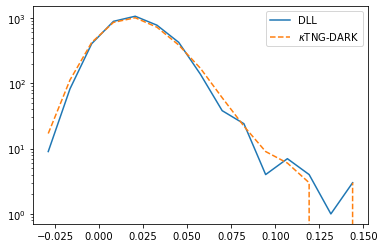

In [45]:
semilogy(center_, tepgd, label='DLL')
semilogy(center_, te,'--', label='$\kappa$TNG-DARK ')
legend()